# EN3160 Assignment-1  
## (Intensity Transformations and Neighborhood Filtering)

- Name - **D.M.T.K.R Dassanayake**
- Index Number - **210095F**
- github repository -  https://github.com/ThathsaraDassanayake/Intensity-Transformations-and-Neighborhood-Filtering


## 1. Intensity Transformation

In [97]:
import numpy as np

def intensity_transformation_pixel(pix_val:int)->float:
    if 50 <= pix_val and pix_val <= 150:
        return 1.55*pix_val + 22.5
    else:
        return pix_val
    
def intensity_transformation_img(img:np.ndarray)->np.ndarray:
    
    new_img = np.zeros(img.shape, dtype=np.uint8)
    for i in range(0, img.shape[0]):
        for j in range(0, img.shape[1]):
            pixel = img[i][j]
            
            new_img[i][j] = intensity_transformation_pixel(pixel)
    
    
    return np.array(new_img, dtype=np.uint8)


In [96]:
import numpy as np
import cv2 

emma_img = cv2.imread("a1images/emma.jpg", cv2.IMREAD_GRAYSCALE)
new_emma_img = intensity_transformation_img(emma_img)

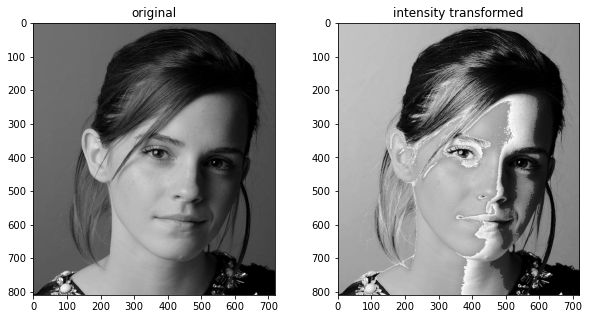

In [95]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title("original")
plt.imshow(emma_img, cmap='gray')

plt.subplot(1, 2, 2)
plt.title("intensity transformed")
plt.imshow(new_emma_img, cmap='gray')


## 2. Brain Image Partitioning

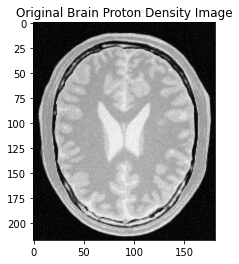

(217, 181)

In [94]:
import cv2
import matplotlib.pyplot as plt

brain_proton_img = cv2.imread("a1images/brain_proton_density_slice.png", cv2.IMREAD_GRAYSCALE)

plt.imshow(brain_proton_img, cmap='gray')
plt.title("Original Brain Proton Density Image")
plt.show()

brain_proton_img.shape

White Matter Intensity: 179
Gray Matter Intensity: 197


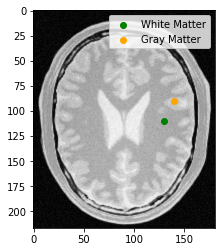

In [100]:
white_matter_point = 130, 110
gray_matter_point = 140, 90

plt.imshow(brain_proton_img, cmap="gray")
plt.scatter(white_matter_point[0], white_matter_point[1], color='green', label='White Matter')
plt.scatter(gray_matter_point[0], gray_matter_point[1], color='orange', label='Gray Matter')
plt.legend()

white_matter_intensity = brain_proton_img[white_matter_point]
gray_matter_intensity = brain_proton_img[gray_matter_point]

print(f"White Matter Intensity: {white_matter_intensity}")
print(f"Gray Matter Intensity: {gray_matter_intensity}")

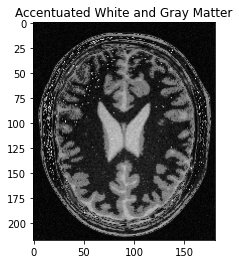

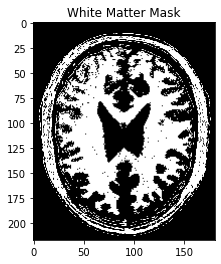

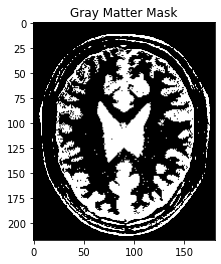

In [102]:
import numpy as np

def accentuate_matter(image):
    transformed_image = np.copy(image)
    gray_matter_mask = (image >= 186) & (image <= 250)
    transformed_image[gray_matter_mask] = 1.75 * image[gray_matter_mask] + 30
    white_matter_mask = (image >= 150) & (image <= 185)
    transformed_image[white_matter_mask] = 1.55 * image[white_matter_mask] + 22.5
    
    
    return transformed_image, white_matter_mask, gray_matter_mask

transformed_brain_img, white_matter_mask, gray_matter_mask = accentuate_matter(brain_proton_img)

plt.imshow(transformed_brain_img, cmap='gray')
plt.title("Accentuated White and Gray Matter")
plt.show()

plt.imshow(white_matter_mask, cmap='gray')
plt.title("White Matter Mask")
plt.show()

plt.imshow(gray_matter_mask, cmap='gray')
plt.title("Gray Matter Mask")
plt.show()


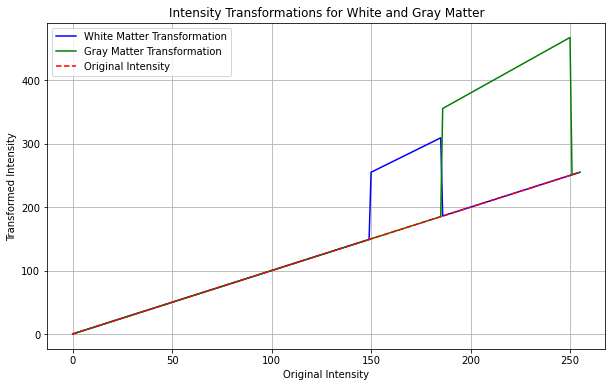

In [103]:
x_vals = np.arange(0, 256)  # Intensity range (0-255)
gray_matter_transformed = np.array([1.75 * x + 30 if 186 <= x <= 250 else x for x in x_vals])
white_matter_transformed = np.array([1.55 * x + 22.5 if 150 <= x <= 185 else x for x in x_vals])

plt.figure(figsize=(10, 6))
plt.plot(x_vals, white_matter_transformed, label='White Matter Transformation', color='blue')
plt.plot(x_vals, gray_matter_transformed, label='Gray Matter Transformation', color='green')
plt.plot(x_vals, x_vals, label='Original Intensity', linestyle='--', color='red')  # Identity line
plt.title('Intensity Transformations for White and Gray Matter')
plt.xlabel('Original Intensity')
plt.ylabel('Transformed Intensity')
plt.legend()
plt.grid(True)
plt.show()



## 3. Gamma Correction

In [104]:
# Q3
bgr_img = cv2.imread("a1images/highlights_and_shadows.jpg")

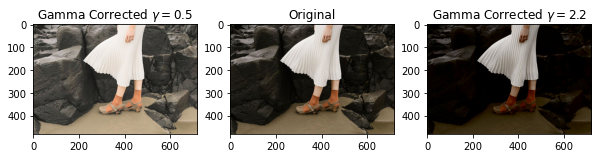

In [105]:
import cv2
import numpy as np

lab_img = cv2.cvtColor(bgr_img, cv2.COLOR_BGR2LAB)

L, A, B = cv2.split(lab_img)

L = L / 255.0

gamma_high = 2.2
L_gamma_corrected_high = np.power(L, gamma_high)

L_gamma_corrected_high = np.uint8(L_gamma_corrected_high * 255)

lab_gamma_corrected_high = cv2.merge((L_gamma_corrected_high, A, B))

gamma_corrected_img_high = cv2.cvtColor(lab_gamma_corrected_high, cv2.COLOR_LAB2BGR)


gamma_low = 0.5
L_gamma_corrected_low = np.power(L, gamma_low)

L_gamma_corrected_low = np.uint8(L_gamma_corrected_low * 255)

lab_gamma_corrected_low = cv2.merge((L_gamma_corrected_low, A, B))

gamma_corrected_img_low = cv2.cvtColor(lab_gamma_corrected_low, cv2.COLOR_LAB2BGR)

fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(10, 5))

# Plot on the first subplot
axs[0].set_title("Gamma Corrected $\gamma = 0.5$")
axs[0].imshow(cv2.cvtColor(gamma_corrected_img_low, cv2.COLOR_BGR2RGB))

# Plot on the second subplot
axs[1].set_title("Original")
axs[1].imshow(cv2.cvtColor(bgr_img, cv2.COLOR_BGR2RGB))

# Plot on the third subplot
axs[2].set_title("Gamma Corrected $\gamma = 2.2$")
axs[2].imshow(cv2.cvtColor(gamma_corrected_img_high, cv2.COLOR_BGR2RGB))

# Show the figure
plt.show()


In [17]:
bgr_img[:, :, 0].shape

(480, 720)

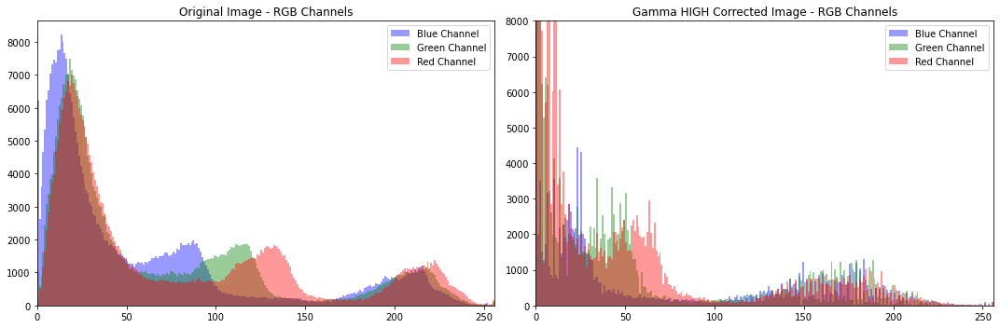

In [106]:
import matplotlib.pyplot as plt
import numpy as np

fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

# Original image histograms (Red, Green, Blue in the same plot)
axs[0].set_title("Original Image - RGB Channels")
axs[0].hist(bgr_img[:, :, 0].flatten(), bins=256, range=[0, 256], color='b', alpha=0.4, label='Blue Channel')
axs[0].hist(bgr_img[:, :, 1].flatten(), bins=256, range=[0, 256], color='g', alpha=0.4, label='Green Channel')
axs[0].hist(bgr_img[:, :, 2].flatten(), bins=256, range=[0, 256], color='r', alpha=0.4, label='Red Channel')
axs[0].set_xlim([0, 256])
axs[0].legend()

# Gamma corrected image histograms (Red, Green, Blue in the same plot)
axs[1].set_title("Gamma HIGH Corrected Image - RGB Channels")
axs[1].hist(gamma_corrected_img_high[:, :, 0].flatten(), bins=256, range=[0, 256], color='b', alpha=0.4, label='Blue Channel')
axs[1].hist(gamma_corrected_img_high[:, :, 1].flatten(), bins=256, range=[0, 256], color='g', alpha=0.4, label='Green Channel')
axs[1].hist(gamma_corrected_img_high[:, :, 2].flatten(), bins=256, range=[0, 256], color='r', alpha=0.4, label='Red Channel')
axs[1].set_xlim([0, 256])
axs[1].set_ylim([0, 8000])  # Set a y-axis limit to reduce dominance of zeros
axs[1].legend()

# Show the figure
plt.tight_layout()
plt.show()


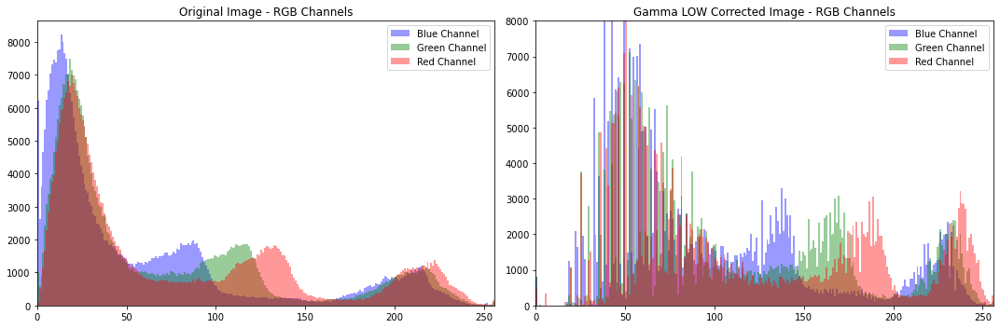

In [107]:
import matplotlib.pyplot as plt
import numpy as np

fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

# Original image histograms (Red, Green, Blue in the same plot)
axs[0].set_title("Original Image - RGB Channels")
axs[0].hist(bgr_img[:, :, 0].flatten(), bins=256, range=[0, 256], color='b', alpha=0.4, label='Blue Channel')
axs[0].hist(bgr_img[:, :, 1].flatten(), bins=256, range=[0, 256], color='g', alpha=0.4, label='Green Channel')
axs[0].hist(bgr_img[:, :, 2].flatten(), bins=256, range=[0, 256], color='r', alpha=0.4, label='Red Channel')
axs[0].set_xlim([0, 256])
axs[0].legend()

# Gamma corrected image histograms (Red, Green, Blue in the same plot)
axs[1].set_title("Gamma LOW Corrected Image - RGB Channels")
axs[1].hist(gamma_corrected_img_low[:, :, 0].flatten(), bins=256, range=[0, 256], color='b', alpha=0.4, label='Blue Channel')
axs[1].hist(gamma_corrected_img_low[:, :, 1].flatten(), bins=256, range=[0, 256], color='g', alpha=0.4, label='Green Channel')
axs[1].hist(gamma_corrected_img_low[:, :, 2].flatten(), bins=256, range=[0, 256], color='r', alpha=0.4, label='Red Channel')
axs[1].set_xlim([0, 256])
axs[1].set_ylim([0, 8000])  # Set a y-axis limit to reduce dominance of zeros
axs[1].legend()

# Show the figure
plt.tight_layout()
plt.show()



## 4. Vibrancy 

In [22]:
spiderman_img = cv2.imread("a1images/spider.png")

# convert the image into HSV color space
hsv_spiderman_img = cv2.cvtColor(spiderman_img, cv2.COLOR_BGR2HSV)
hsv_spiderman_img.shape

(438, 780, 3)

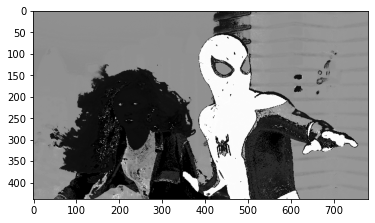

In [23]:
plt.imshow(hsv_spiderman_img[:,:,0], cmap="gray")

In [24]:
# get the saturation plane of the image
spiderman_hue_plane = hsv_spiderman_img[:,:,0]
spiderman_saturation_plane = hsv_spiderman_img[:,:,1] 
spiderman_value_plane = hsv_spiderman_img[:,:,2]

In [25]:
# print min and max of each plane in HSV 

print(f"Min and Max of Hue Plane: {np.min(spiderman_hue_plane)}, {np.max(spiderman_hue_plane)}")
print(f"Min and Max of Saturation Plane: {np.min(spiderman_saturation_plane)}, {np.max(spiderman_saturation_plane)}")
print(f"Min and Max of Value Plane: {np.min(spiderman_value_plane)}, {np.max(spiderman_value_plane)}")

Min and Max of Hue Plane: 0, 179
Min and Max of Saturation Plane: 0, 185
Min and Max of Value Plane: 8, 231


In [26]:
import math 

def vibrancy_transformation_pix(input_pix_val:int, a:float, sigma:int=70)->float:
    x = input_pix_val
    return min( x + a*128*math.exp(-(x-128)**2/(2*sigma**2)), 255)

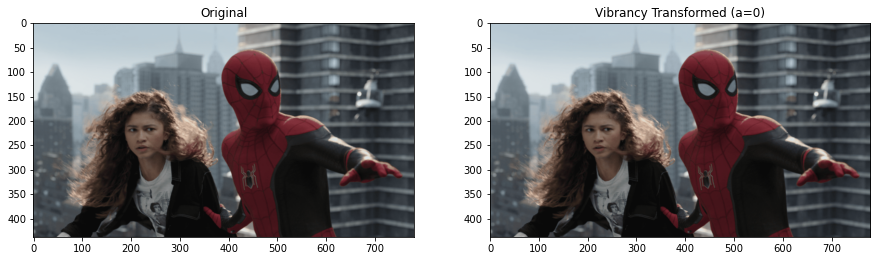

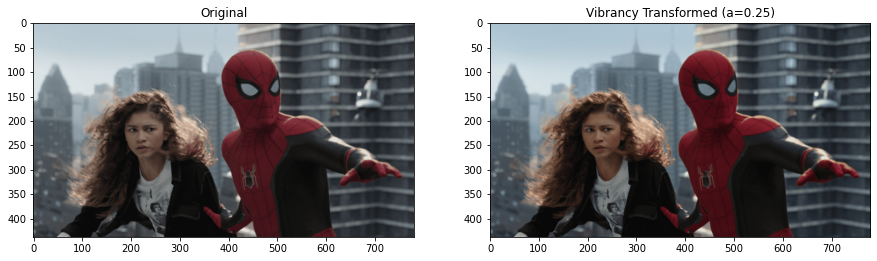

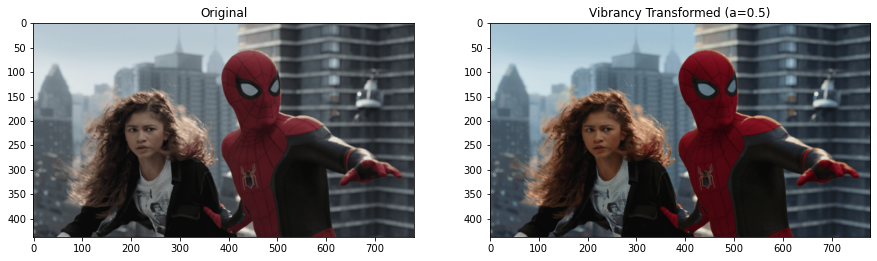

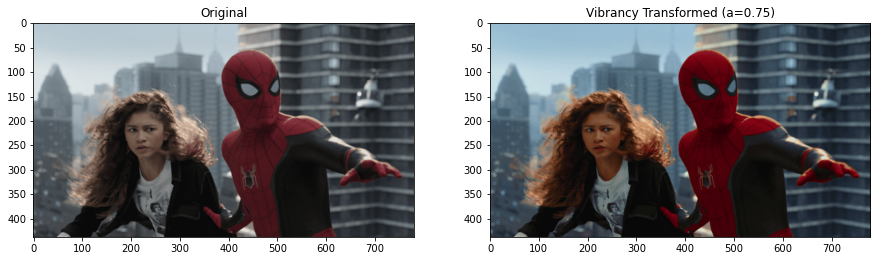

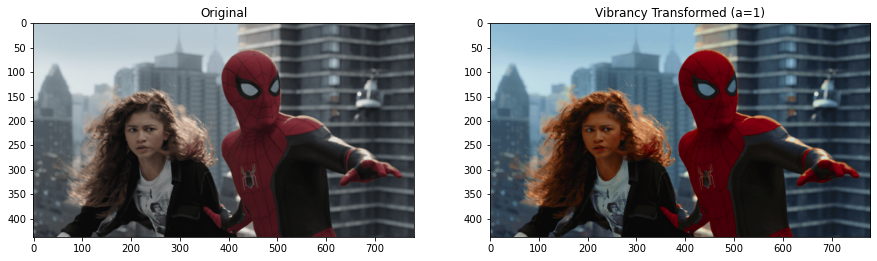

In [28]:
hsv_images = {0: None, 0.25: None, 0.5: None, 0.75: None, 1: None}

for a in hsv_images.keys():
    new_spiderman_saturation_plane = np.zeros(spiderman_saturation_plane.shape, dtype=np.uint8)
    
    # Apply vibrancy transformation to each pixel
    for i in range(spiderman_saturation_plane.shape[0]):
        for j in range(spiderman_saturation_plane.shape[1]):
            new_spiderman_saturation_plane[i][j] = vibrancy_transformation_pix(spiderman_saturation_plane[i][j], a=a)

    # Combine the new saturation plane with the original hue and value planes
    new_hsv_spiderman_img = cv2.merge((spiderman_hue_plane, new_spiderman_saturation_plane, spiderman_value_plane))

    # Convert the image back to BGR color space
    new_spiderman_img = cv2.cvtColor(new_hsv_spiderman_img, cv2.COLOR_HSV2BGR)

    # Store the transformed image in the dictionary
    hsv_images[a] = new_spiderman_img

    # Create subplots for visualization
    fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 10))

    # Plot the original image on the first subplot
    axs[0].set_title("Original")
    axs[0].imshow(cv2.cvtColor(spiderman_img, cv2.COLOR_BGR2RGB))

    # Plot the vibrancy transformed image on the second subplot
    axs[1].set_title(f"Vibrancy Transformed (a={a})")
    axs[1].imshow(cv2.cvtColor(new_spiderman_img, cv2.COLOR_BGR2RGB))

    # Display the plot for this transformation
    plt.show()


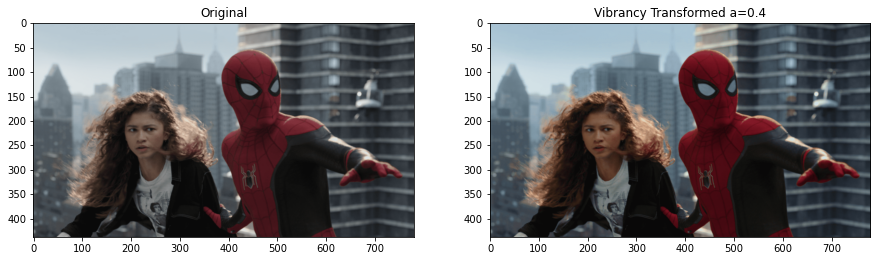

In [29]:
a = 0.4

new_spiderman_saturation_plane = np.zeros(spiderman_saturation_plane.shape, dtype=np.uint8)
    
# Apply vibrancy transformation to each pixel
for i in range(spiderman_saturation_plane.shape[0]):
    for j in range(spiderman_saturation_plane.shape[1]):
        new_spiderman_saturation_plane[i][j] = vibrancy_transformation_pix(spiderman_saturation_plane[i][j], a=a)

# Combine the new saturation plane with the original hue and value planes
new_hsv_spiderman_img = cv2.merge((spiderman_hue_plane, new_spiderman_saturation_plane, spiderman_value_plane))

# Convert the image back to BGR color space
new_spiderman_img = cv2.cvtColor(new_hsv_spiderman_img, cv2.COLOR_HSV2BGR)

# Store the transformed image in the dictionary
hsv_images[a] = new_spiderman_img

# Create subplots for visualization
fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(15, 10))

# Plot the original image on the first subplot
axs[0].set_title("Original")
axs[0].imshow(cv2.cvtColor(spiderman_img, cv2.COLOR_BGR2RGB))

# Plot the vibrancy transformed image on the second subplot
axs[1].set_title(f"Vibrancy Transformed a={a}")
axs[1].imshow(cv2.cvtColor(new_spiderman_img, cv2.COLOR_BGR2RGB))


**4.C)** a = 0.5

In [30]:
spiderman_saturation_plane.min(), spiderman_saturation_plane.max()

(0, 185)

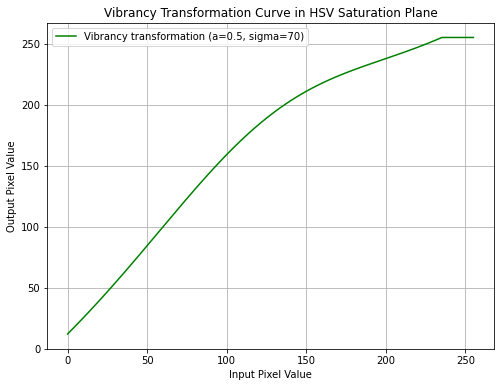

In [41]:
import math
import numpy as np
import matplotlib.pyplot as plt


# Set the transformation parameter 'a'
a = 0.5
sigma = 70

# Generate a range of input pixel values from 0 to 255
input_values = np.arange(0, 256)

# Apply the transformation to each pixel value
output_values = [vibrancy_transformation_pix(x, a, sigma) for x in input_values]

# Plot the transformation
plt.figure(figsize=(8, 6))
plt.plot(input_values, output_values, label=f'Vibrancy transformation (a={a}, sigma={sigma})', color='green')
plt.xlabel('Input Pixel Value')
plt.ylabel('Output Pixel Value')
plt.title('Vibrancy Transformation Curve in HSV Saturation Plane')
plt.legend()
plt.grid(True)
plt.show()



## 5. Histogram Equalization

In [38]:
import numpy as np
import matplotlib.pyplot as plt
import cv2

def histogram_equalization(image):
    # Calculate the histogram
    hist, bins = np.histogram(image.flatten(), 256, [0, 256])
    
    # Calculate the cumulative distribution function (CDF)
    cdf = hist.cumsum()
    
    # Normalize the CDF
    cdf_normalized = cdf * hist.max() / cdf.max()
    
    # Create a lookup table
    cdf_m = np.ma.masked_equal(cdf, 0)
    cdf_m = (cdf_m - cdf_m.min()) * 255 / (cdf_m.max() - cdf_m.min())
    cdf = np.ma.filled(cdf_m, 0).astype('uint8')
    
    # Apply the lookup table to the image
    equalized_image = cdf[image]
    
    return equalized_image

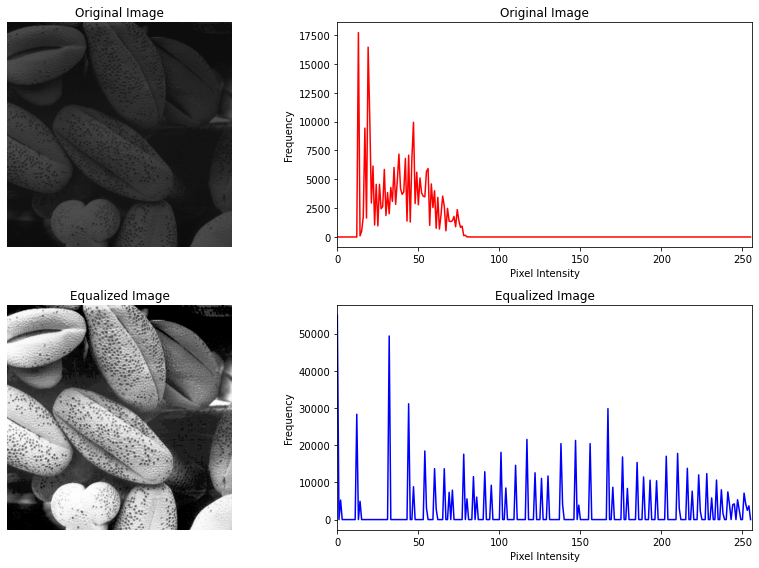

In [43]:
import numpy as np
import cv2
import matplotlib.pyplot as plt

def histogram_equalization(image):
    """Apply histogram equalization to a grayscale image."""
    # Calculate the histogram
    hist, bins = np.histogram(image.flatten(), 256, [0, 256])
    
    # Calculate the cumulative distribution function (CDF)
    cdf = hist.cumsum()
    
    # Normalize the CDF
    cdf_m = np.ma.masked_equal(cdf, 0)  # Mask the zeros (to avoid division by zero)
    cdf_m = (cdf_m - cdf_m.min()) * 255 / (cdf_m.max() - cdf_m.min())  # Normalize
    cdf = np.ma.filled(cdf_m, 0).astype('uint8')  # Fill masked values with 0
    
    # Apply the lookup table to the image
    equalized_image = cdf[image]
    
    return equalized_image

def histogram_equalization_custom(image_path):
    """Perform histogram equalization on the grayscale image from the given image path."""
    # Read and convert the image to grayscale
    image = cv2.imread(image_path)
    gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Perform histogram equalization
    equalized_image = histogram_equalization(gray_image)

    # Step 1: Calculate histogram for the original image
    hist, bins = np.histogram(gray_image.flatten(), 256, [0, 256])

    return gray_image, equalized_image, hist

def plot_histogram_and_images(original_image, equalized_image, original_hist):
    """Plot the original and equalized images along with their histograms."""
    # Calculate histogram of the equalized image
    hist_equalized, _ = np.histogram(equalized_image.flatten(), 256, [0, 256])

    # Plotting
    plt.figure(figsize=(12, 8))

    # Original image and histogram
    plt.subplot(221)
    plt.imshow(original_image, cmap='gray')
    plt.title('Original Image')
    plt.axis('off')

    plt.subplot(222)
    plt.plot(original_hist, color='red')
    plt.title('Original Image')
    plt.xlim([0, 256])
    plt.xlabel('Pixel Intensity')
    plt.ylabel('Frequency')

    # Equalized image and histogram
    plt.subplot(223)
    plt.imshow(equalized_image, cmap='gray')
    plt.title('Equalized Image')
    plt.axis('off')

    plt.subplot(224)
    plt.plot(hist_equalized, color='blue')
    plt.title('Equalized Image')
    plt.xlim([0, 256])
    plt.xlabel('Pixel Intensity')
    plt.ylabel('Frequency')

    plt.tight_layout()
    plt.show()

# Example usage
image_path = "a1images/shells.tif"

# Perform histogram equalization
original_shell_image, equalized_shell_image, original_shell_hist = histogram_equalization_custom(image_path)

# Plot original and equalized images with their histograms
plot_histogram_and_images(cv2.cvtColor(original_shell_image, cv2.COLOR_BGR2RGB), cv2.cvtColor(equalized_shell_image, cv2.COLOR_BGR2RGB), original_shell_hist)


## 6. Histogram Equalized Foreground

In [44]:
jeniffer_img = cv2.imread("a1images/jeniffer.jpg")
jeniffer_img.shape

(2160, 3840, 3)

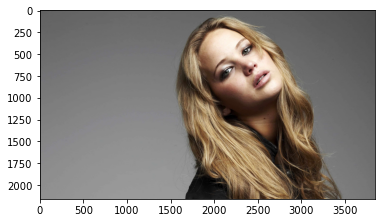

In [45]:
plt.imshow(cv2.cvtColor(jeniffer_img, cv2.COLOR_BGR2RGB))

In [46]:
jeniffer_hsv_img = cv2.cvtColor(jeniffer_img, cv2.COLOR_BGR2HSV)
jeniffer_hue_plane = jeniffer_hsv_img[:,:,0]
jeniffer_saturation_plane = jeniffer_hsv_img[:,:,1]
jeniffer_value_plane = jeniffer_hsv_img[:,:,2]

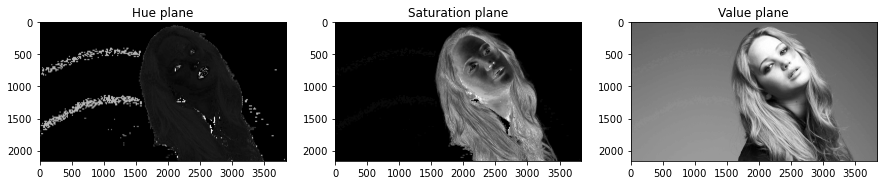

In [47]:
plt.subplots(1, 3, figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.title("Hue plane")
plt.imshow(jeniffer_hue_plane, cmap="gray")

plt.subplot(1, 3, 2)
plt.title("Saturation plane")
plt.imshow(jeniffer_saturation_plane, cmap="gray")

plt.subplot(1, 3, 3)
plt.title("Value plane")
plt.imshow(jeniffer_value_plane, cmap="gray")

6) b) Saturation plane can be used to extract the foreground

In [48]:
jeniffer_saturation_plane.max()

255

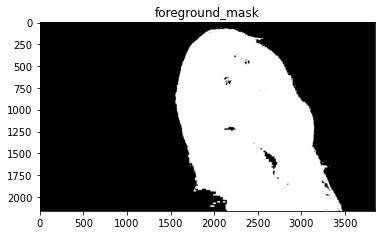

In [49]:
# Foreground mask for the image
foreground_mask = jeniffer_saturation_plane >15
plt.title("foreground_mask")
plt.imshow(foreground_mask, cmap='gray')

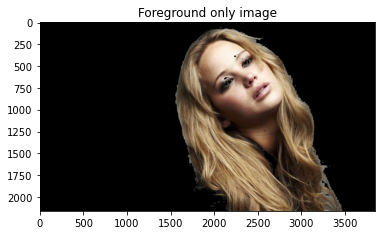

In [50]:
# Get the foreground only from the image
foreground_only = cv2.bitwise_and(jeniffer_img, jeniffer_img, mask=foreground_mask.astype(np.uint8));

# Display the foreground only image
plt.title("Foreground only image")
plt.imshow(cv2.cvtColor(foreground_only, cv2.COLOR_BGR2RGB))

### Histogram equalisation done considering the RGB

In [51]:
foreground_only.shape

(2160, 3840, 3)

In [52]:
foreground_mask.astype(np.uint8).sum()

2701907

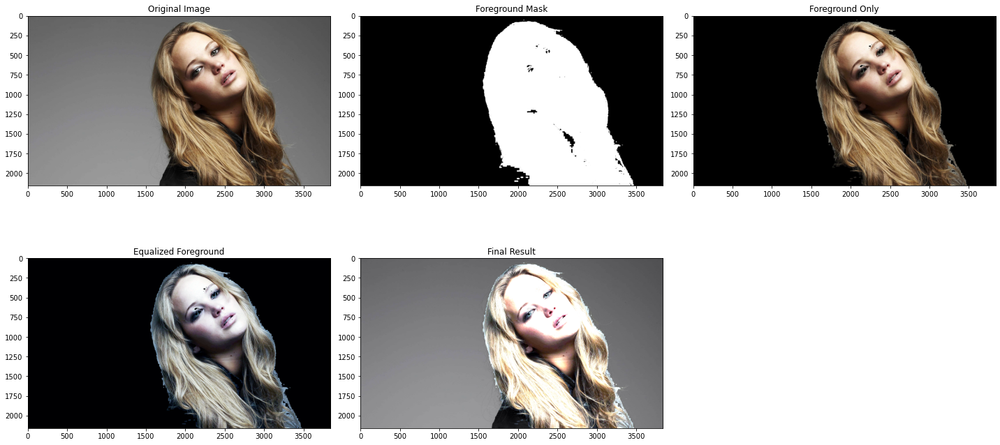

In [53]:
# Compute histograms for each channel
hist_b = cv2.calcHist([foreground_only], [0], foreground_mask.astype(np.uint8), [256], [0, 256])
hist_g = cv2.calcHist([foreground_only], [1], foreground_mask.astype(np.uint8), [256], [0, 256])
hist_r = cv2.calcHist([foreground_only], [2], foreground_mask.astype(np.uint8), [256], [0, 256])

# (d) Obtain cumulative sum of histograms
cum_hist_b = np.cumsum(hist_b)
cum_hist_g = np.cumsum(hist_g)
cum_hist_r = np.cumsum(hist_r)

# (e) Histogram equalization for foreground
def equalize_histogram(cum_hist, pixel_count):
    return ((cum_hist / pixel_count) * 255).astype(np.uint8)

pixel_count = foreground_mask.astype(np.uint8).sum()

# Look up tables for each color channel
lut_b = equalize_histogram(cum_hist_b, pixel_count)
lut_g = equalize_histogram(cum_hist_g, pixel_count)
lut_r = equalize_histogram(cum_hist_r, pixel_count)

# Apply equalization to foreground
equalized_foreground = np.zeros_like(foreground_only)
equalized_foreground[:,:,0] = cv2.LUT(foreground_only[:,:,0], lut_b)
equalized_foreground[:,:,1] = cv2.LUT(foreground_only[:,:,1], lut_g)
equalized_foreground[:,:,2] = cv2.LUT(foreground_only[:,:,2], lut_r)

# (f) Combine equalized foreground with original background
background = cv2.bitwise_and(jeniffer_img, jeniffer_img, mask=cv2.bitwise_not(foreground_mask.astype(np.uint8)))
result = cv2.add(equalized_foreground, background)

# Display results
plt.figure(figsize=(20, 10))
plt.subplot(231)
plt.imshow(cv2.cvtColor(jeniffer_img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.subplot(232)
plt.imshow(foreground_mask, cmap='gray')
plt.title('Foreground Mask')
plt.subplot(233)
plt.imshow(cv2.cvtColor(foreground_only, cv2.COLOR_BGR2RGB))
plt.title('Foreground Only')
plt.subplot(234)
plt.imshow(cv2.cvtColor(equalized_foreground, cv2.COLOR_BGR2RGB))
plt.title('Equalized Foreground')
plt.subplot(235)
plt.imshow(cv2.cvtColor(result, cv2.COLOR_BGR2RGB))
plt.title('Final Result')
plt.tight_layout()
plt.show()

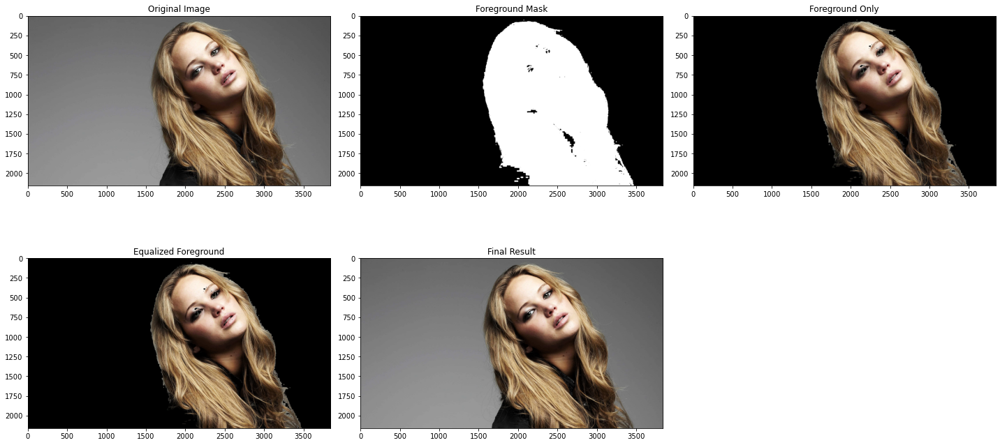

In [54]:
# Extract the background from the original image
jeniffer_background_bgr = jeniffer_img-foreground_only
 
# Convert the image into HSV plane
jeniffer_hsv_img = cv2.cvtColor(jeniffer_img, cv2.COLOR_BGR2HSV)

# Split the image into HSV planes
jeniffer_hue_plane = jeniffer_hsv_img[:,:,0]
jeniffer_saturation_plane = jeniffer_hsv_img[:,:,1]
jeniffer_value_plane = jeniffer_hsv_img[:,:,2]

# Get the foreground image in the Value plane
foreground_mask = jeniffer_saturation_plane > 15
jeniffer_foreground_value = cv2.bitwise_and(jeniffer_value_plane, jeniffer_value_plane, mask=foreground_mask.astype(np.uint8))

# Compute the histogram of the value plane
hist_v = cv2.calcHist([jeniffer_foreground_value], [0], foreground_mask.astype(np.uint8), [256], [0, 256])

#  Obtain cumulative sum of histograms
cum_hist_v = np.cumsum(hist_v)

pixel_count = foreground_mask.astype(np.uint8).sum()

# Look up tables for each color channel
lut_v = equalize_histogram(cum_hist_v, pixel_count)


# Apply equalization to foreground
jeniffer_equalized_foreground_value = np.zeros_like(jeniffer_foreground_value)
jeniffer_equalized_foreground_value = cv2.LUT(jeniffer_foreground_value, lut_v)



# Merge the equalized value plane with the original hue and saturation planes
jeniffer_equalized_foreground_hsv_img = cv2.merge((jeniffer_hue_plane, jeniffer_saturation_plane, jeniffer_equalized_foreground_value))

# Convert the image back to BGR color space
jeniffer_equalised_foreground_bgr_img = cv2.cvtColor(jeniffer_equalized_foreground_hsv_img, cv2.COLOR_HSV2BGR)


# Note: No color space conversion is needed here as both images are in BGR
jeniffer_result = cv2.add(jeniffer_equalised_foreground_bgr_img, jeniffer_background_bgr)



# Display results
plt.figure(figsize=(20, 10))
plt.subplot(231)
plt.imshow(cv2.cvtColor(jeniffer_img, cv2.COLOR_BGR2RGB))
plt.title('Original Image')
plt.subplot(232)
plt.imshow(foreground_mask, cmap='gray')
plt.title('Foreground Mask')
plt.subplot(233)
plt.imshow(cv2.cvtColor(foreground_only, cv2.COLOR_BGR2RGB))
plt.title('Foreground Only')
plt.subplot(234)
plt.imshow(cv2.cvtColor(jeniffer_equalised_foreground_bgr_img, cv2.COLOR_BGR2RGB))
plt.title('Equalized Foreground')
plt.subplot(235)
plt.imshow(cv2.cvtColor(jeniffer_result, cv2.COLOR_BGR2RGB))
plt.title('Final Result')
plt.tight_layout()
plt.show()


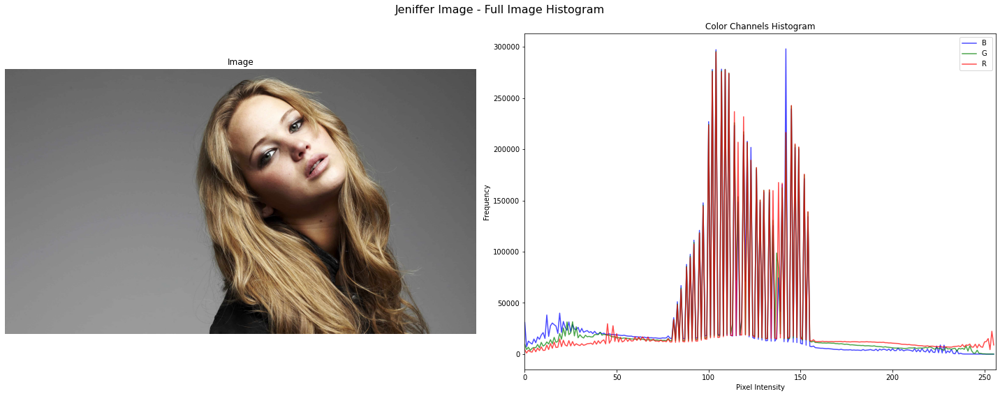

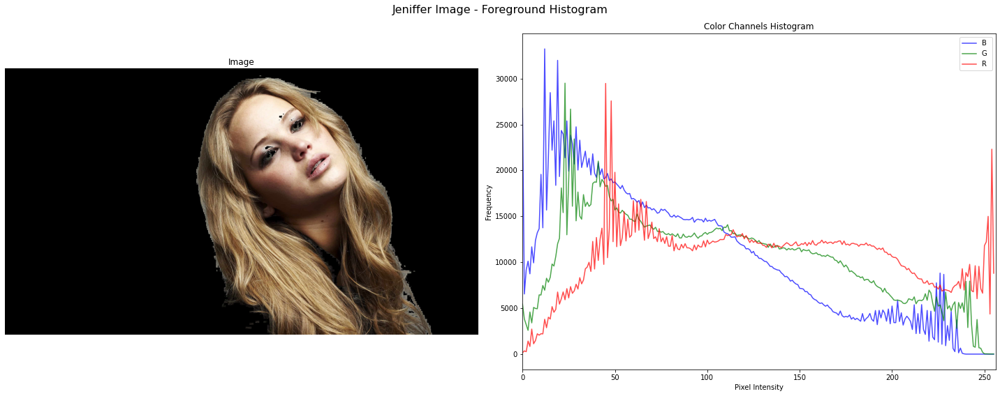

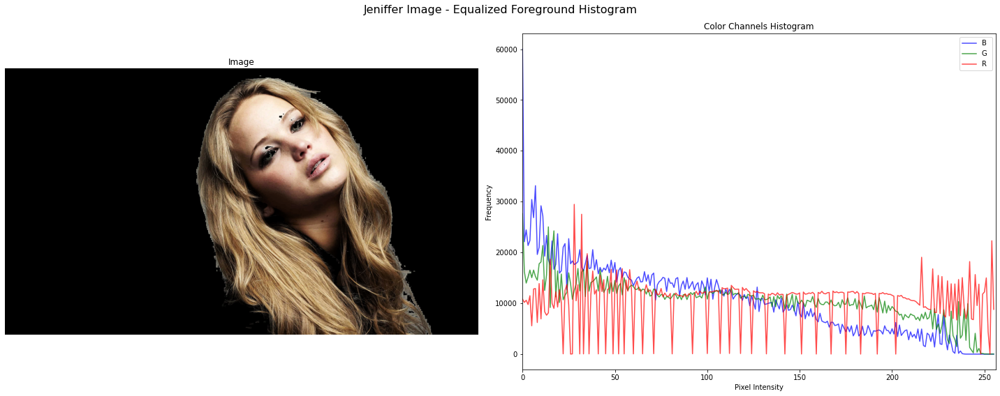

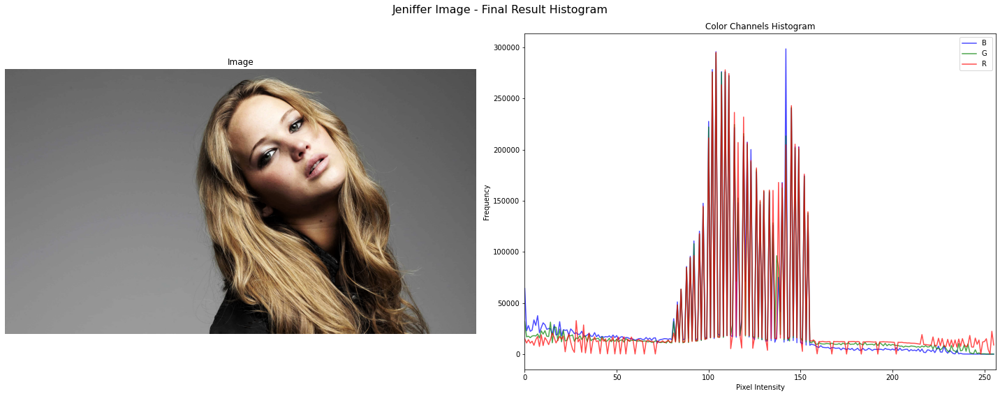

In [57]:
import matplotlib.pyplot as plt
import numpy as np
import cv2

def display_image_histogram(image, mask=None, title="Image Histogram"):
    
    # Determine if the image is grayscale or color
    is_color = len(image.shape) == 3 and image.shape[2] == 3
    
    # Create subplots
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 8))
    fig.suptitle(title, fontsize=16)
    
    # Display the image
    if is_color:
        ax1.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    else:
        ax1.imshow(image, cmap='gray')
    ax1.set_title("Image")
    ax1.axis('off')
    
    # Calculate and display histogram(s)
    if is_color:
        colors = ('b', 'g', 'r')
        for i, color in enumerate(colors):
            hist = cv2.calcHist([image], [i], mask, [256], [0, 256])
            ax2.plot(hist, color=color, alpha=0.7, label=f'{color.upper()} ')
        ax2.set_title("Color Channels Histogram")
    else:
        hist = cv2.calcHist([image], [0], mask, [256], [0, 256])
        ax2.plot(hist, color='gray', alpha=0.7)
        ax2.set_title("Grayscale Histogram")
    
    ax2.set_xlim([0, 256])
    ax2.set_xlabel('Pixel Intensity')
    ax2.set_ylabel('Frequency')
    if is_color:
        ax2.legend()
    
    plt.tight_layout()
    plt.show()

# Usage examples:

# 1. For a color image without mask
display_image_histogram(jeniffer_img, title="Jeniffer Image - Full Image Histogram")

# 2. For a color image with mask (foreground only)
display_image_histogram(foreground_only, mask=foreground_mask.astype(np.uint8), title="Jeniffer Image - Foreground Histogram")

# 3. For the equalized foreground (assuming you've already computed it)
display_image_histogram(jeniffer_equalised_foreground_bgr_img, mask=foreground_mask.astype(np.uint8), title="Jeniffer Image - Equalized Foreground Histogram")

# 4. For the final result (assuming you've already computed it)
display_image_histogram(jeniffer_result,  title="Jeniffer Image - Final Result Histogram")


## 7. Spatial Filtering

### Sobel filtering

In [58]:
# Using the existing filter2D to Sobel filter the image

albert_img = cv2.imread("a1images/einstein.png", cv2.IMREAD_GRAYSCALE)
albert_img.shape


(380, 364)

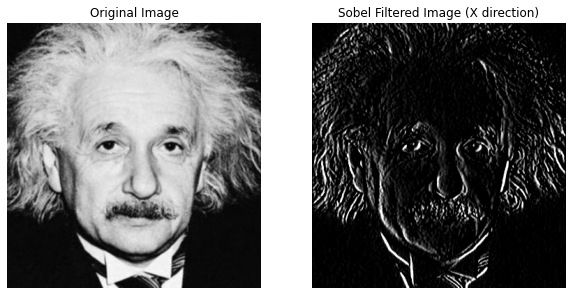

In [59]:
# Define a Sobel filter kernel (for detecting edges in x direction)
sobel_kernel_x = np.array([[-1, 0, 1],
                           [-2, 0, 2],
                           [-1, 0, 1]])

# Apply the Sobel filter using filter2D function
sobel_x = cv2.filter2D(albert_img, -1, sobel_kernel_x)

# Display the original image and the Sobel filtered image
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(albert_img, cmap='gray')
plt.title('Original Image')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(sobel_x, cmap='gray')
plt.title('Sobel Filtered Image (X direction)')
plt.axis('off')

plt.show()


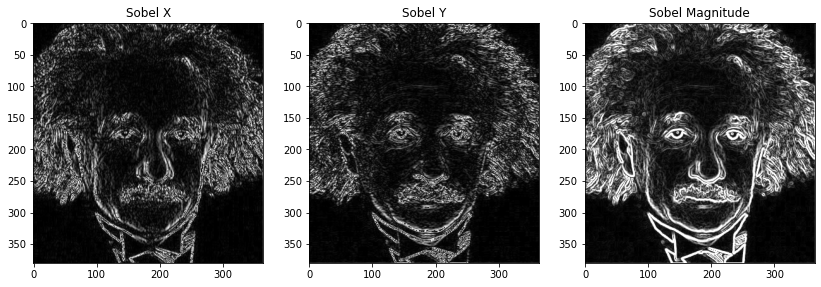

[[ 1  0 -1]
 [ 2  0 -2]
 [ 1  0 -1]]


In [60]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Load the grayscale image
albert_img = cv2.imread("a1images/einstein.png", cv2.IMREAD_GRAYSCALE)

# Get image dimensions
height, width = albert_img.shape

# Define Sobel kernels
sobel_kernel_x = np.array([[1, 0, -1],
                           [2, 0, -2],
                           [1, 0, -1]])

sobel_kernel_y = np.array([[1, 2, 1],
                           [ 0,  0,  0],
                           [ -1, -2,  -1]])

# Initialize empty arrays to store results
sobel_x = np.zeros_like(albert_img, dtype=np.float64)
sobel_y = np.zeros_like(albert_img, dtype=np.float64)

# Padding the image to handle the edges
padded_img = np.pad(albert_img, ((1, 1), (1, 1)), mode='constant')

# Perform convolution with the Sobel kernel manually
for i in range(1, height+1):
    for j in range(1, width+1):
        # Extract the 3x3 region from the padded image
        region = padded_img[i-1:i+2, j-1:j+2]
        
        # Apply the Sobel kernels
        gx = np.sum(sobel_kernel_x * region)
        gy = np.sum(sobel_kernel_y * region)
        
        # Store the result in the output arrays
        sobel_x[i-1, j-1] = gx
        sobel_y[i-1, j-1] = gy

# Combine the horizontal and vertical Sobel results to get the gradient magnitude
sobel_magnitude = np.sqrt(sobel_x**2 + sobel_y**2)
sobel_magnitude = np.clip(sobel_magnitude, 0, 255)  # Clip values to valid range

# Convert the result back to uint8 format
sobel_x = np.uint8(np.abs(sobel_x))
sobel_y = np.uint8(np.abs(sobel_y))
sobel_magnitude = np.uint8(sobel_magnitude)

# Plotting the results
plt.figure(figsize=(14, 7))

plt.subplot(1, 3, 1)
plt.imshow(sobel_x, cmap='gray')
plt.title('Sobel X')

plt.subplot(1, 3, 2)
plt.imshow(sobel_y, cmap='gray')
plt.title('Sobel Y')

plt.subplot(1, 3, 3)
plt.imshow(sobel_magnitude, cmap='gray')
plt.title('Sobel Magnitude')

plt.show()

print(sobel_kernel_x)


In [61]:
# Define Sobel X kernel (horizontal edge detection)
sobel_kernel_x = np.array([[1, 0, -1],
                           [2, 0, -2],
                           [1, 0, -1]])

# Initialize an empty array to store the Sobel X result
sobel_x = np.zeros_like(albert_img, dtype=np.float64)

# Padding the image to handle the edges
padded_img = np.pad(albert_img, ((1, 1), (1, 1)), mode='constant')

# Perform convolution with the Sobel X kernel manually
for i in range(1, height+1):
    for j in range(1, width+1):
        # Extract the 3x3 region from the padded image
        region = padded_img[i-1:i+2, j-1:j+2]
        
        # Apply the Sobel X kernel
        gx = np.sum(sobel_kernel_x * region)
        
        # Store the result in the Sobel X output array
        sobel_x[i-1, j-1] = gx

# Convert the result back to uint8 format and normalize the values to 0-255
sobel_x = np.uint8(np.clip(np.abs(sobel_x), 0, 255))

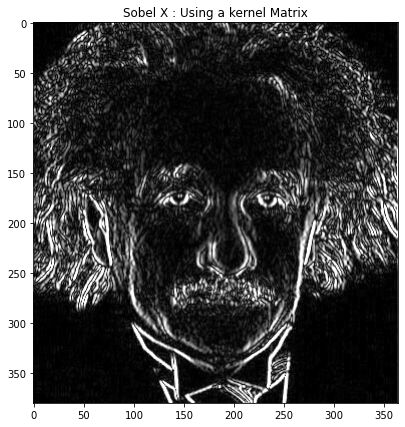

[[ 1  0 -1]
 [ 2  0 -2]
 [ 1  0 -1]]


In [62]:
# Plotting the results
plt.figure(figsize=(7, 7))

plt.subplot(1, 1, 1)
plt.imshow(sobel_x, cmap='gray')
plt.title('Sobel X : Using a kernel Matrix')

plt.show()

print(sobel_kernel_x)

####  Separable Sobel Filter

In [63]:
# Define the 1D Sobel kernels (separable)
sobel_kernel_v = np.array([1, 2, 1])  # Vertical 1D kernel (for smoothing)
sobel_kernel_h = np.array([1, 0, -1])  # Horizontal 1D kernel (for edge detection)

# Initialize empty arrays to store intermediate and final results
sobel_x_intermediate = np.zeros_like(albert_img, dtype=np.float64)
sobel_x = np.zeros_like(albert_img, dtype=np.float64)

# Padding the image to handle the edges (for 1D vertical filter)
padded_img = np.pad(albert_img, ((1, 1), (0, 0)), mode='constant')

# Step 1: Apply vertical 1D kernel (along the rows)
for i in range(1, height+1):
    for j in range(0, width):
        # Apply the vertical kernel to the 3-pixel neighborhood in the column
        sobel_x_intermediate[i-1, j] = np.sum(padded_img[i-1:i+2, j] * sobel_kernel_v)

# Padding the intermediate result for horizontal filtering
padded_intermediate = np.pad(sobel_x_intermediate, ((0, 0), (1, 1)), mode='constant')

# Step 2: Apply horizontal 1D kernel (along the columns)
for i in range(0, height):
    for j in range(1, width+1):
        # Apply the horizontal kernel to the 3-pixel neighborhood in the row
        sobel_x[i, j-1] = np.sum(padded_intermediate[i, j-1:j+2] * sobel_kernel_h)

# Convert the result back to uint8 format, normalizing the values to 0-255
sobel_x = np.uint8(np.clip(np.abs(sobel_x), 0, 255))

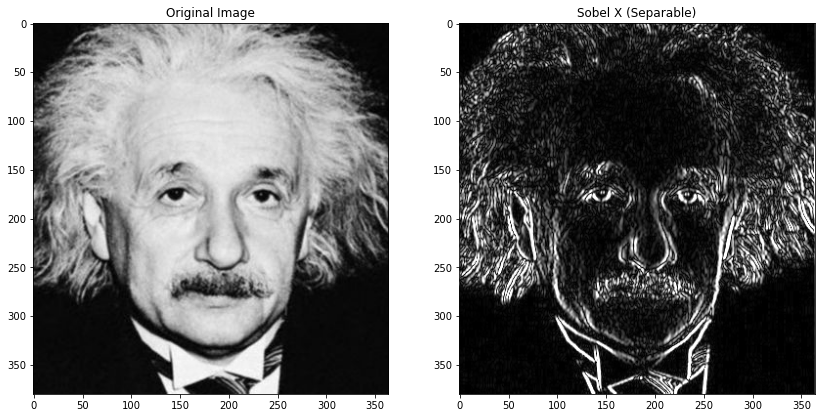

In [64]:

# Plotting the results
plt.figure(figsize=(14, 7))

plt.subplot(1, 2, 1)
plt.imshow(albert_img, cmap='gray')
plt.title('Original Image')

plt.subplot(1, 2, 2)
plt.imshow(sobel_x, cmap='gray')
plt.title('Sobel X (Separable)')

plt.show()



## 8. Zoom

### interpolation methods : testing

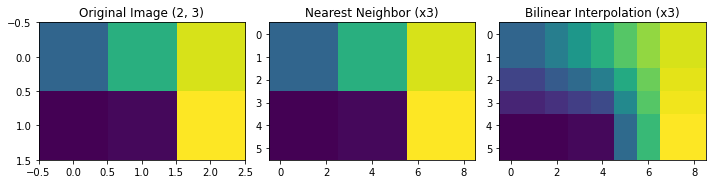

In [66]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

# Original image (2x3 grayscale)
test_img = np.array([[30, 45, 60], [14, 15, 63]], dtype=np.uint8)

# Define the scale factor for zooming
scale_factor = 3

# Compute the new size (width * scale_factor, height * scale_factor)
new_size = (test_img.shape[1] * scale_factor, test_img.shape[0] * scale_factor)

# Resize the image using nearest neighbor interpolation
zoomed_test_img_nn = cv2.resize(test_img, new_size, interpolation=cv2.INTER_NEAREST)

# Resize the image using bilinear interpolation
zoomed_test_img_bilinear = cv2.resize(test_img, new_size, interpolation=cv2.INTER_LINEAR)

# Plot the original and resized images
plt.figure(figsize=(10, 5))

# Display the original image
plt.subplot(1, 3, 1)
plt.title(f'Original Image {test_img.shape}')
plt.imshow(test_img)
plt.axis('on')

# Display the nearest neighbor resized image
plt.subplot(1, 3, 2)
plt.title(f'Nearest Neighbor (x{scale_factor})')
plt.imshow(zoomed_test_img_nn)
plt.axis('on')

# Display the bilinear resized image
plt.subplot(1, 3, 3)
plt.title(f'Bilinear Interpolation (x{scale_factor})')
plt.imshow(zoomed_test_img_bilinear)
plt.axis('on')

# Show the plots
plt.tight_layout()
plt.show()


In [74]:
# Import required libraries
import cv2
import numpy as np
from matplotlib import pyplot as plt

# Function to zoom the image
def zoom_image(image, scale, interpolation):
    height, width = image.shape[:2]
    new_size = (int(width * scale), int(height * scale))
    return cv2.resize(image, new_size, interpolation=interpolation)

# Function to compute normalized SSD between two images
def compute_normalized_ssd(img1, img2, bypass_size_error=True):
    if not bypass_size_error:
        # Ensure images are of the same size
        assert img1.shape == img2.shape, "Images must be the same shape for SSD computation."
    else: 
        # Crop the larger image to match the smaller image
        min_height = min(img1.shape[0], img2.shape[0])
        min_width = min(img1.shape[1], img2.shape[1])

        img1 = img1[:min_height, :min_width]
        img2 = img2[:min_height, :min_width]

    
    
    # Compute the sum of squared differences
    ssd = np.sum((img1.astype("float32") - img2.astype("float32")) ** 2)
    
    # Normalize by the number of pixels
    norm_ssd = ssd / np.prod(img1.shape)
    
    return norm_ssd

# Function to display images side-by-side
def display_images(original, nearest, bilinear, titles):
    plt.figure(figsize=(15, 15))

    # Original image
    plt.subplot(3, 1, 1)
    plt.imshow(cv2.cvtColor(original, cv2.COLOR_BGR2RGB))
    plt.title(titles[0])
    plt.axis('off')

    # Nearest-neighbor zoomed image
    plt.subplot(3, 1, 2)
    plt.imshow(cv2.cvtColor(nearest, cv2.COLOR_BGR2RGB))
    plt.title(titles[1])
    plt.axis('off')

    # Bilinear zoomed image
    plt.subplot(3,1, 3)
    plt.imshow(cv2.cvtColor(bilinear, cv2.COLOR_BGR2RGB))
    plt.title(titles[2])
    plt.axis('off')

    plt.show()


def get_zoom_and_orignal_img(small_img, big_img, scale_factor=4, bypass_size_error=True):
        # Scale factor
    scale_factor = 4

    # Zoom using nearest-neighbor interpolation
    zoomed_nn = zoom_image(small_img, scale_factor, cv2.INTER_NEAREST)

    # Zoom using bilinear interpolation
    zoomed_bilinear = zoom_image(small_img, scale_factor, cv2.INTER_LINEAR)

    # Compute normalized SSD for nearest-neighbor zoomed image
    ssd_nn = compute_normalized_ssd(big_img, zoomed_nn, bypass_size_error=bypass_size_error)

    # Compute normalized SSD for bilinear zoomed image
    ssd_bilinear = compute_normalized_ssd(big_img, zoomed_bilinear, bypass_size_error=bypass_size_error)

    # Print out SSD values
    print(f"Normalized SSD (Nearest Neighbor): {ssd_nn}")
    print(f"Normalized SSD (Bilinear): {ssd_bilinear}")

    # Display the images
    titles = ["Original Image", f"Nearest Neighbor Zoomed - SSD={ssd_nn}", f"Bilinear Zoomed - SSD={ssd_bilinear}"]
    display_images(big_img, zoomed_nn, zoomed_bilinear, titles)


In [75]:
im01_small_img = cv2.imread("a1images/a1q5images/im01small.png")
im01_img = cv2.imread("a1images/a1q5images/im01.png")

im02_small_img = cv2.imread("a1images/a1q5images/im02small.png")
im02_img = cv2.imread("a1images/a1q5images/im02.png")

im03_small_img = cv2.imread("a1images/a1q5images/im03small.png")
im03_img = cv2.imread("a1images/a1q5images/im03.png")

taylor_very_small_img = cv2.imread("a1images/a1q5images/taylor_very_small.jpg")
taylor_small_img = cv2.imread("a1images/a1q5images/taylor_small.jpg")
taylor_img = cv2.imread("a1images/a1q5images/taylor.jpg")

Normalized SSD (Nearest Neighbor): 136.2690534979424
Normalized SSD (Bilinear): 115.09185185185186


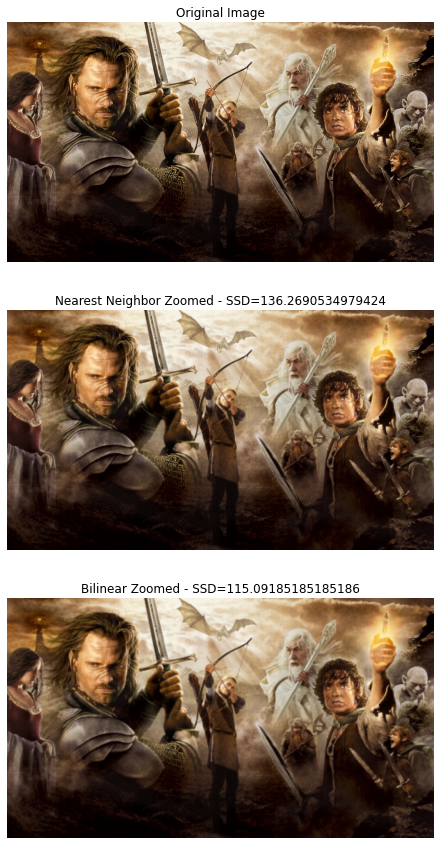

In [76]:
get_zoom_and_orignal_img(small_img=im01_small_img, big_img=im01_img, scale_factor=4, bypass_size_error=False)

Normalized SSD (Nearest Neighbor): 26.446071759259258
Normalized SSD (Bilinear): 18.34591087962963


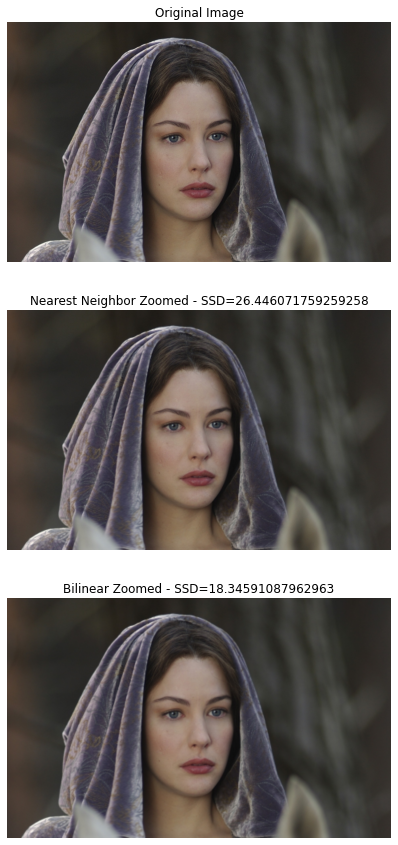

In [77]:
get_zoom_and_orignal_img(small_img=im02_small_img, big_img=im02_img, scale_factor=4, bypass_size_error=False)

In [78]:
im03_small_img.shape

(365, 600, 3)

In [79]:
im03_small_img.shape[0]*4, im03_small_img.shape[1]*4

(1460, 2400)

In [80]:
im03_img.shape

(1459, 2400, 3)

Normalized SSD (Nearest Neighbor): 67.58167390145458
Normalized SSD (Bilinear): 51.20135861701318


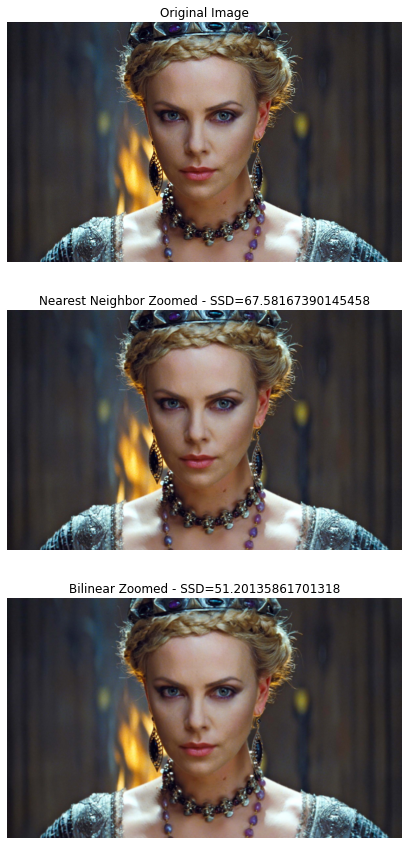

In [81]:
get_zoom_and_orignal_img(small_img=im03_small_img, big_img=im03_img, scale_factor=4, bypass_size_error=True)

In [82]:
taylor_very_small_img.shape

(28, 50, 3)

In [83]:
taylor_very_small_img.shape[0]*4, taylor_very_small_img.shape[1]*4

(112, 200)

In [84]:
taylor_small_img.shape

(112, 200, 3)

In [85]:
taylor_small_img.shape[0]*4, taylor_small_img.shape[1]*4

(448, 800)

In [86]:
taylor_img.shape

(560, 1000, 3)

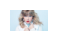

In [87]:
import cv2
import matplotlib.pyplot as plt

# Convert the image from BGR to RGB
img_rgb = cv2.cvtColor(taylor_very_small_img, cv2.COLOR_BGR2RGB)

# Get the image dimensions
height, width, _ = img_rgb.shape

# Set the figure size to match the image size (in inches, assuming 1 dpi = 1 pixel)
fig = plt.figure(figsize=(width / 100, height / 100), dpi=100)

# Display the image
plt.imshow(img_rgb)
plt.axis('off')  # Optional: to hide axis
plt.show()


Normalized SSD (Nearest Neighbor): 228.6223363095238
Normalized SSD (Bilinear): 197.40949404761903


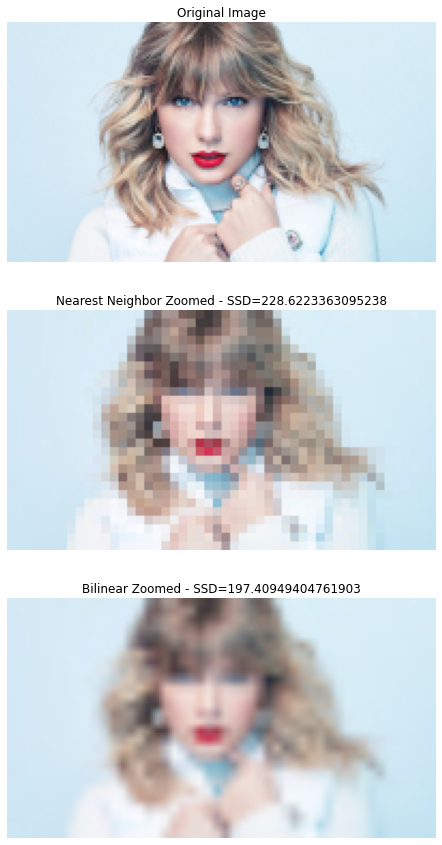

In [88]:
get_zoom_and_orignal_img(small_img=taylor_very_small_img, big_img=taylor_small_img, scale_factor=4, bypass_size_error=False)


### 9. Segmentation


In [89]:
daisy_img = cv2.imread("a1images/daisy.jpg")

In [90]:
daisy_img_rgb = cv2.cvtColor(daisy_img, cv2.COLOR_BGR2RGB)

# Create an initial mask
mask = np.zeros(daisy_img.shape[:2], np.uint8)

# Create background and foreground models
bgd_model = np.zeros((1, 65), np.float64)
fgd_model = np.zeros((1, 65), np.float64)

# Define a rectangle for the GrabCut algorithm
# The rectangle should enclose the object to be segmented (foreground).
rect = (50, 50, daisy_img.shape[1]-50, daisy_img.shape[0]-50)

# Apply the GrabCut algorithm
cv2.grabCut(daisy_img, mask, rect, bgd_model, fgd_model, 5, cv2.GC_INIT_WITH_RECT)

# Modify the mask such that all probable foreground and definite foreground pixels are marked as foreground
mask2 = np.where((mask == 2) | (mask == 0), 0, 1).astype('uint8')

# Extract the segmented foreground
foreground = daisy_img_rgb * mask2[:, :, np.newaxis]

# Extract the background (everything outside the foreground)
background = daisy_img_rgb * (1 - mask2[:, :, np.newaxis])

In [91]:

blurred_background = cv2.GaussianBlur(background, (55, 55), 0)

# Combine the sharp foreground with the blurred background
enhanced_image = np.where(mask2[:, :, np.newaxis] == 1, daisy_img_rgb, blurred_background)

9.C)  The Gaussian blur kernel uses neighboring dark pixels to compute the new pixel value, with dark pixels also contributing to the filtering process.

In [92]:
# Original image blur
daisy_img_rgb_blurred = cv2.GaussianBlur(daisy_img_rgb, (55, 55), 0)

# Combine the sharp foreground with the blurred original
enhanced_image_new = np.where(mask2[:, :, np.newaxis] == 1, daisy_img_rgb, daisy_img_rgb_blurred)

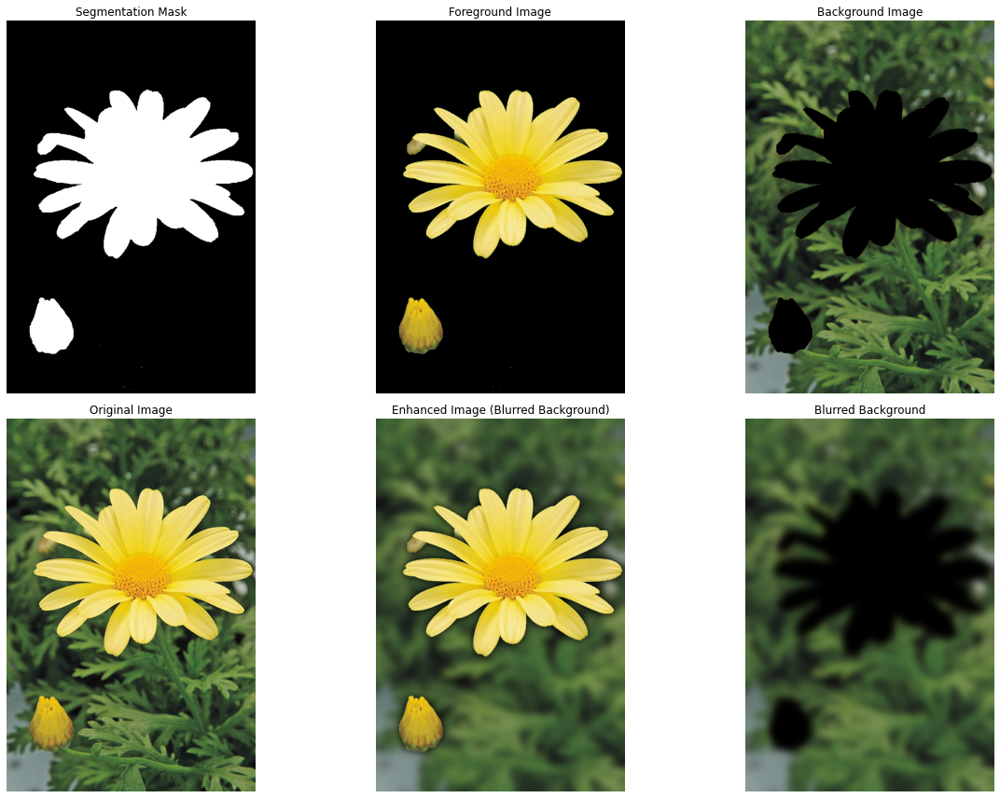

In [93]:
# Import necessary libraries
import matplotlib.pyplot as plt

# Define the number of subplots and figure size
fig, ax = plt.subplots(2, 3, figsize=(18, 12))

# Plot the first row (Segmentation Mask, Foreground, Background)
ax[0, 0].imshow(mask2, cmap='gray')
ax[0, 0].set_title('Segmentation Mask')
ax[0, 0].axis('off')

ax[0, 1].imshow(foreground)
ax[0, 1].set_title('Foreground Image')
ax[0, 1].axis('off')

ax[0, 2].imshow(background)
ax[0, 2].set_title('Background Image')
ax[0, 2].axis('off')

# Plot the second row (Original, Enhanced, and Blurred Background)
ax[1, 0].imshow(daisy_img_rgb)
ax[1, 0].set_title('Original Image')
ax[1, 0].axis('off')

ax[1, 1].imshow(enhanced_image)
ax[1, 1].set_title('Enhanced Image (Blurred Background)')
ax[1, 1].axis('off')

ax[1, 2].imshow(blurred_background)
ax[1, 2].set_title('Blurred Background')
ax[1, 2].axis('off')

# Show the combined plot
plt.tight_layout()
plt.show()
